# Lab 2: Image Segmentation, Filter, Feature points

This week you learned about manipulating image color from the pixel values and histogram. In this session you will get some more experience coding image segmentation algorithms and filtering with pixel location information too. 

There are four parts and you should aim to finish first two parts in the lab sesion on Tuesday.

There are one task each for Part 1 and 2 and 4. Please complete them and submit them with the finished jupyter note book.

# Part 1 Segmentation

Your task will be to code a simple statistical method that uses Region growing or connected components.

## Task 1 K-means Segmentation


In previsou task you have oeprated over all pixels in the image for computing histogram. In this session you will get some experience coding image segmentation algorithms. Your task will be to code a simple statistical method that uses k-means clustering on all pixels.

K-means clustering is a well-known approach for separating data (often of high dimensionality) into
different groups depending on their distance. In the case of images this is a useful method for
segmenting an image into regions, provided that the number of regions (k) is known in advance. It is
based on the fact that pixels belonging to the same region will most likely have similar intensities. 

The algorithm is:

a) Given the number of clusters, k, initialise their centres to some values.

b) Go over the pixels in the image and assign each one to its closest cluster according to its distance to the centre of the cluster.

c) Update the cluster centres to be the average of the pixels added.

d) Repeat steps b and c until the cluster centres do not get updated anymore.

In [1]:
# %matplotlib inline is a magic function for displaying the image in the notebook
%matplotlib inline
import numpy as np
import cv2
import copy
import matplotlib.image as mpimg
from matplotlib import pyplot as plt



### Task 1.1 Use the k-means function in sklearn and see results

First, you can use the built-in kmeans function in sklearn and see the results. 
You can figure out how to this from the specification: https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html

### Load image

Important Note: Don't forget to convert the image to float representation.

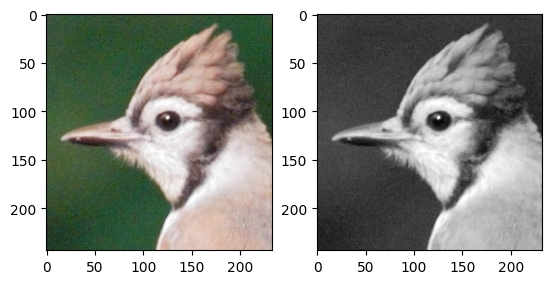

In [2]:
# Load image and conver to float representation
raw_img = cv2.imread("../dataset/sample_image.jpg")
raw_gray_img = cv2.cvtColor(raw_img, cv2.COLOR_BGR2GRAY)
img = raw_img.astype(np.float32) / 255.
gray_img = raw_gray_img.astype(np.float32) / 255.
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.subplot(1, 2, 2)
plt.imshow(gray_img, "gray")

### Results on Gray-scale Image

[[0.7622416 ]
 [0.28946128]]


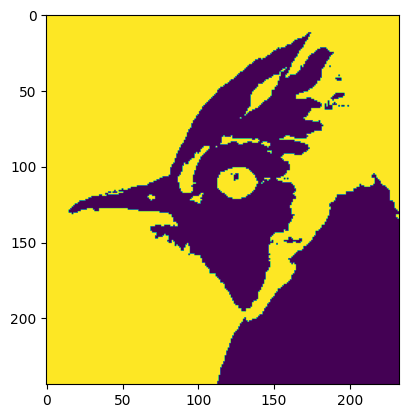

In [3]:
from sklearn.cluster import KMeans
# Flatten the image dimension first
gray_img_flat = gray_img.reshape(-1, 1)
kmeans = KMeans(n_clusters=2, random_state=0).fit(gray_img_flat)

H, W = gray_img.shape
# Unflatten back
labels = kmeans.labels_.reshape(H, W)
plt.imshow(labels)
print(kmeans.cluster_centers_)

[[0.8224677  0.7527642  0.728614  ]
 [0.23835205 0.3262207  0.22156382]]


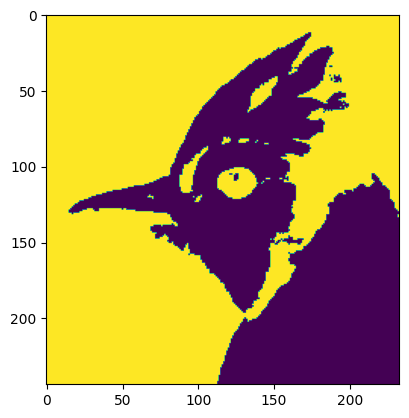

In [4]:
### Results on RGB image
img_flat = img.reshape(-1, 3)
kmeans = KMeans(n_clusters=2, random_state=0).fit(img_flat)

H, W, _ = img.shape
# Unflatten back
labels = kmeans.labels_.reshape(H, W)
plt.imshow(labels)
print(kmeans.cluster_centers_)

### Task 1.2 Implement your own k-means

Now you need to implement your own k-means function. Use your function on different greyscale images and try comparing the results to the results you get from sklearn kmeans function.

### Implement your own functions here:

In [5]:
import numpy as np

def my_kmeans(I, k):
    """
    Parameters
    ----------
    I: the image to be segmented (greyscale to begin with) H by W array
    k: the number of clusters (use a simple image with k=2 to begin with)

    Returns
    ----------
    clusters: a vector that contains the final cluster centers
    L: an array the same size as the input image that contains the label for each of the image pixels, according to which cluster it belongs
    """

    assert len(I.shape) == 2, "Wrong input dimensions! Please make sure you are using a gray-scale image!"

    # Flatten the image to a 1D array
    pixels = I.flatten()

    # Step 1: Initialize cluster centers randomly
    clusters = np.random.choice(pixels, k, replace=False)

    # Step 2: Initialize labels array
    L = np.zeros_like(pixels, dtype=int)

    # Step 3: Iteratively update clusters until convergence
    for _ in range(100):  # Maximum 100 iterations
        # Assign each pixel to the nearest cluster center
        distances = np.abs(pixels[:, None] - clusters[None, :])
        L = np.argmin(distances, axis=1)

        # Update cluster centers as the mean of assigned pixels
        new_clusters = np.array([pixels[L == j].mean() if np.any(L == j) else clusters[j] for j in range(k)])

        # Check for convergence
        if np.allclose(clusters, new_clusters, atol=1e-4):
            break
        clusters = new_clusters

    # Reshape L to match the original image shape
    L = L.reshape(I.shape)

    return clusters, L

def my_kmeans_rgb(I, k):
    """
    Parameters
    ----------
    I: the image to be segmented (RGB image) H by W by 3 array
    k: the number of clusters

    Returns
    ----------
    clusters: a vector that contains the final cluster centers (each center is an RGB color)
    L: an array the same size as the input image (H by W) that contains the label for each of the image pixels, 
       according to which cluster it belongs
    """

    assert len(I.shape) == 3, "Wrong input dimensions! Please make sure you are using an RGB image!"

    # Flatten the image to a 2D array where each row is an RGB pixel
    H, W, C = I.shape
    pixels = I.reshape(-1, 3)

    # Step 1: Initialize cluster centers randomly from the pixels
    clusters = pixels[np.random.choice(pixels.shape[0], k, replace=False)]

    # Step 2: Initialize labels array
    L = np.zeros(pixels.shape[0], dtype=int)

    # Step 3: Iteratively update clusters until convergence
    for _ in range(100):  # Maximum 100 iterations
        # Calculate distances from each pixel to each cluster center
        distances = np.linalg.norm(pixels[:, None] - clusters[None, :], axis=2)
        
        # Assign each pixel to the nearest cluster center
        L = np.argmin(distances, axis=1)
        
        # Update each cluster center as the mean of assigned pixels
        new_clusters = np.array([pixels[L == j].mean(axis=0) if np.any(L == j) else clusters[j] for j in range(k)])
        
        # Check for convergence
        if np.allclose(clusters, new_clusters, atol=1e-4):
            break
        clusters = new_clusters

    # Reshape L to match the original image shape (H, W)
    L = L.reshape(H, W)

    return clusters, L


### Show results here:

[0.761426   0.28898618]


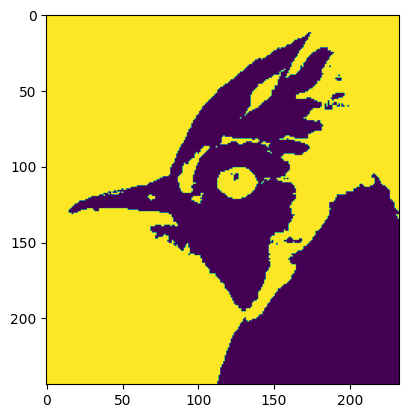

In [6]:
centroids, labels = my_kmeans(gray_img, 2)
print(centroids)
plt.imshow(labels)

[[0.82262504 0.7529227  0.7288037 ]
 [0.23846196 0.32622516 0.22166412]]

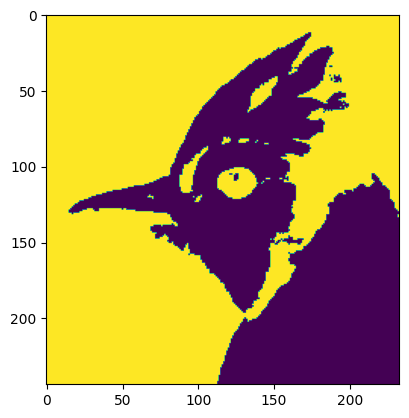

In [7]:
centroids, labels = my_kmeans_rgb(img, 2)
print(centroids)
plt.imshow(labels)

### More things to try out:
1. Try different values for k. For k > 2 you will need some way to display the output L (other than simple black and white). Consider using a colour map with the imshow function.
2. Adapt your function so that it will handle colour dataset as well. What changes do you have to make?

[[0.6494617 ]
 [0.28190446]
 [0.8398899 ]]


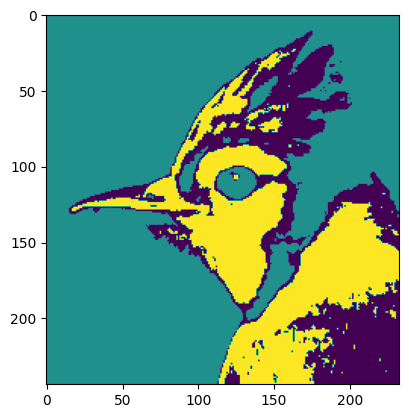

In [8]:
from sklearn.cluster import KMeans
# Flatten the image dimension first
gray_img_flat = gray_img.reshape(-1, 1)
kmeans = KMeans(n_clusters=3, random_state=0).fit(gray_img_flat)

H, W = gray_img.shape
# Unflatten back
labels = kmeans.labels_.reshape(H, W)
plt.imshow(labels)
print(kmeans.cluster_centers_)

[[0.8524996  0.78917205 0.7675315 ]
 [0.21685222 0.3181044  0.20755364]
 [0.60546786 0.5130178  0.4790076 ]]


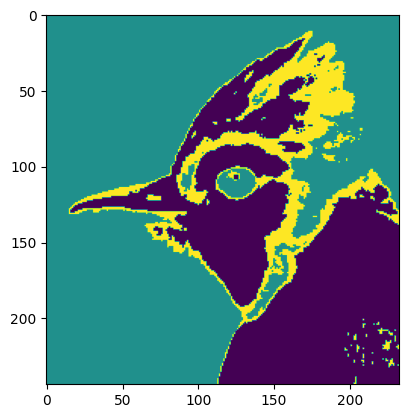

In [9]:
### Results on RGB image
img_flat = img.reshape(-1, 3)
kmeans = KMeans(n_clusters=3, random_state=0).fit(img_flat)

H, W, _ = img.shape
# Unflatten back
labels = kmeans.labels_.reshape(H, W)
plt.imshow(labels)
print(kmeans.cluster_centers_)

[0.28073347 0.6257318  0.8242718 ]


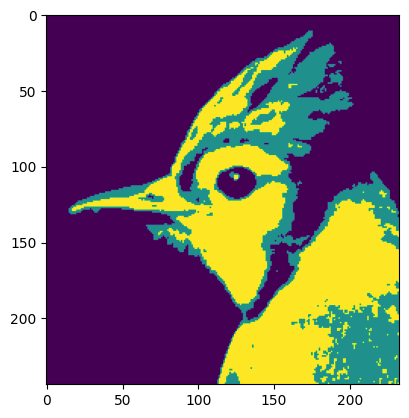

In [10]:
# k=3
centroids, labels = my_kmeans(gray_img, 3)
plt.imshow(labels)
print(centroids)

[[0.85215896 0.788789   0.7671615 ]
 [0.21662343 0.3180324  0.20743664]
 [0.6035048  0.5111953  0.47724313]]


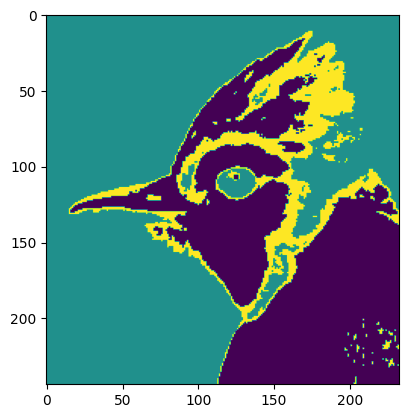

In [11]:
centroids, labels = my_kmeans_rgb(img, 3)
plt.imshow(labels)
print(centroids)

In [12]:
# to visualize the plots within the notebook
%matplotlib inline
# to enable interactive
#%matplotlib ipympl
import matplotlib.image as mpimg
from matplotlib import pyplot as plt
import random
from PIL import Image

## Task 2: Region growing
Region growing is a simple way to segment a region of interest from the background of an image.
It takes in a gray-scale image and produces a binary image as output, where a value of 1 represents the region of interest and a value of 0 represents the background.

The algorithm is:
1. Start from a seed pixel.
2. Add neighbouring pixels that satisfy the criteria defining a region (e.g. similar intensity values, intensity above a threshold).
3. Repeat until we can include no more pixels.

Your task is to write a function in Python that implements the region growing algorithm.
Something like:
```
  segmented_img = region_growing(img, x, y)
```

* img: the image to be segmented
* x: the x-coordinate (j if indexed by numpy array) of the seed pixel
* y: the y-coordinate (i if indexed by numpy array) of the seed pixel
* segmented_img: the binary image output of region growing

**Hint:** This is process basically a **Breadth-first Search (BFS)**, which could be easily implemented it with a **queue** (check out collections.deque in PyThon): 

1. Initialise the queue with the seed pixel. 
2. Every time pop the first element from the queue and add its neighbour pixels to the queue if they satisfy the criteria (e.g. intensity above the threshold).
3. Finish when the queue is empty

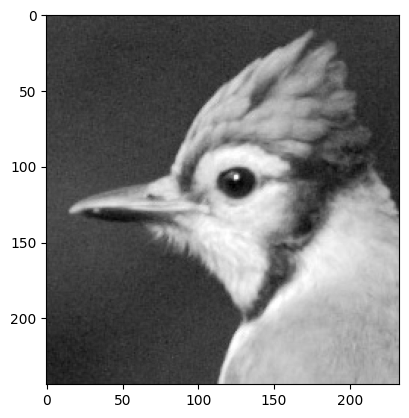

In [13]:
# Load your image
img = cv2.imread('../dataset/sample_image.jpg')
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(np.float32)
plt.imshow(gray_img, 'gray')
plt.show()

In [14]:
from collections import deque
import numpy as np

def region_growing(img, x, y, thresh=100, connectedness=4):
    '''
    Implement region growing algorithm to segment a gray scaled image into regions
    :param img: gray scaled image [H, W]
    :param x, y: coordinate of the seed pixel
    :param thresh: region growing threshold
    :param connectedness: either 4 or 8, indicating the type of connectedness for neighboring pixels
    :return: segmented image [H, W] with segmented region marked as 1, and background as 0
    '''
    assert img.ndim == 2, "Expect a gray-scale image!"
    assert connectedness in (4, 8), "Connectedness must be either 4 or 8!"
    
    # Get the shape of the image
    H, W = img.shape
    
    # Initialize the segmented image as a binary mask
    segmented = np.zeros((H, W), dtype=np.uint8)
    
    # Intensity of the seed pixel
    seed_intensity = img[x, y]
    
    # Define neighbor offsets based on connectedness
    if connectedness == 4:
        neighbors = [(-1, 0), (1, 0), (0, -1), (0, 1)]
    elif connectedness == 8:
        neighbors = [(-1, 0), (1, 0), (0, -1), (0, 1), (-1, -1), (-1, 1), (1, -1), (1, 1)]
    
    # Initialize the queue with the seed pixel
    queue = deque([(x, y)])
    segmented[x, y] = 1  # Mark the seed pixel as part of the region

    while queue:
        cx, cy = queue.popleft()
        
        # Check all neighbors
        for dx, dy in neighbors:
            nx, ny = cx + dx, cy + dy
            
            # Check if the neighbor is within bounds and not yet visited
            if 0 <= nx < H and 0 <= ny < W and segmented[nx, ny] == 0:
                # Check if the pixel intensity is within the threshold
                if abs(int(img[nx, ny]) - int(seed_intensity)) <= thresh:
                    segmented[nx, ny] = 1  # Mark as part of the region
                    queue.append((nx, ny))  # Add to queue for further exploration

    return segmented

    

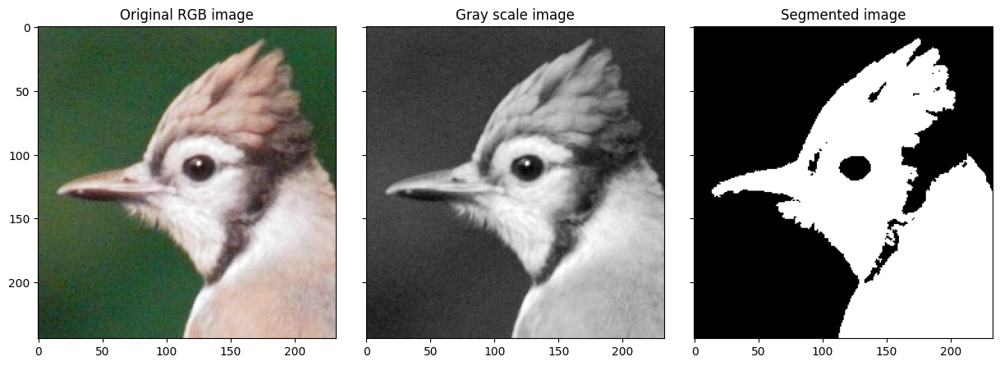

In [15]:
# define set of seed pixel points
x, y = 100, 100

# run region growing algorithm
seg_img = region_growing(gray_img, x, y, thresh=85, connectedness=4)

# Show Original and segmented image
fig, axis = plt.subplots(1, 3, figsize=(15,10), sharey=True)
fig.subplots_adjust(wspace=0.1, hspace=0.05)
axis[0].imshow(img)
axis[0].set_title('Original RGB image')

axis[1].imshow(gray_img, 'gray')
axis[1].set_title('Gray scale image')

axis[2].imshow(seg_img, 'gray')
axis[2].set_title('Segmented image')
plt.show()

### There are two important factors that influence the performance of a region growing algorithm.

#### 1. The first is the seed pixel selection.
Try the following:
1. Pick a random pixel in the image.
2. Plot the histogram of the image, select a reasonable threshold and then search for a pixel whose intensity value is above the threshold (look for the `matplotlib.pyplot.hist()` function).
3. Do it manually (Hint: You can do this by enabling the interactive mode for `matplotlib`).

Which one is better?

(array([[  0.,  51., 181., ...,   0.,   0.,   0.],
        [  1.,  44., 187., ...,   0.,   0.,   0.],
        [  0.,  46., 183., ...,   0.,   0.,   0.],
        ...,
        [  0.,  74.,  50., ...,  56.,   0.,   0.],
        [  0.,  74.,  53., ...,  41.,   0.,   0.],
        [  0.,  86.,  43., ...,  38.,   0.,   0.]]),
 array([ 16.        ,  39.90000153,  63.79999924,  87.69999695,
        111.59999847, 135.5       , 159.3999939 , 183.30000305,
        207.19999695, 231.09999084, 255.        ]),
 <a list of 233 BarContainer objects>)

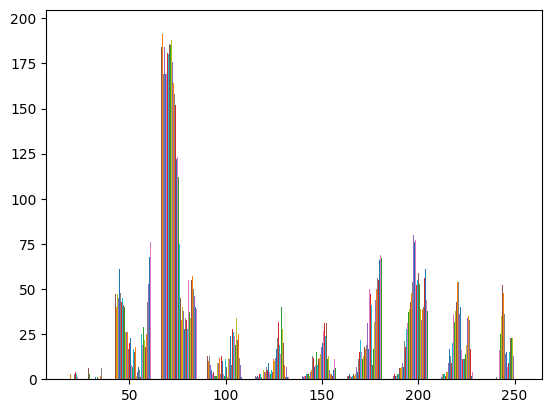

In [16]:
plt.hist(gray_img)

Random seed selected at: (184, 87)
Selected threshold based on histogram analysis: 85.6640625
Histogram-based seed selected at: (117, 156) with threshold 85.6640625


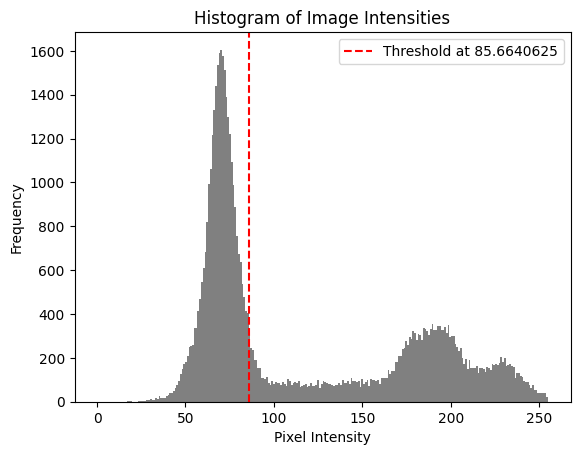

Random Seed: (184, 87)
Histogram-based Seed: (np.int64(117), np.int64(156))


In [17]:
import numpy as np
import matplotlib.pyplot as plt

def select_seed(img, method="histogram"):
    """
    Select a seed pixel in an image based on the specified method.

    Parameters
    ----------
    img : np.ndarray
        The grayscale image (2D array).
    method : str, optional
        The method for selecting the seed: "random", "histogram", or "manual".

    Returns
    -------
    x, y : int, int
        Coordinates of the selected seed pixel.
    """
    assert img.ndim == 2, "Expect a grayscale image!"
    assert method in ["random", "histogram", "manual"], "Invalid method! Choose 'random', 'histogram', or 'manual'."

    if method == "random":
        # Method 1: Pick a random pixel
        H, W = img.shape
        x, y = np.random.randint(0, H), np.random.randint(0, W)
        print(f"Random seed selected at: ({x}, {y})")

    elif method == "histogram":
        # Method 2: Use intensity threshold based on histogram
        hist, bin_edges, _ = plt.hist(img.ravel(), bins=256, range=(0, 255), color='gray')
        peak_index = np.argmax(hist)  # Find the bin with the highest frequency

        # Find the threshold to the right of the peak where frequency drops significantly
        threshold_index = peak_index + np.argmax(hist[peak_index:] < hist[peak_index] * 0.25)
        threshold = bin_edges[threshold_index]
        print(f"Selected threshold based on histogram analysis: {threshold}")

        # Find coordinates of pixels above the threshold
        coords = np.argwhere(img >= threshold)

        # Pick a random coordinate among the selected pixels
        x, y = coords[np.random.choice(len(coords))]
        print(f"Histogram-based seed selected at: ({x}, {y}) with threshold {threshold}")

        # Highlight threshold on histogram
        plt.axvline(x=threshold, color='r', linestyle='--', label=f'Threshold at {threshold}')
        plt.xlabel("Pixel Intensity")
        plt.ylabel("Frequency")
        plt.title("Histogram of Image Intensities")
        plt.legend()
        plt.show()

    elif method == "manual":
        # Method 3: Manual selection using interactive mode
        %matplotlib tk
        plt.imshow(img, cmap="gray")
        plt.title("Click on the image to select the seed pixel")
        coords = plt.ginput(1)  # Enable user to click to select a point
        plt.close()
        %matplotlib inline

        # Convert coordinates to integer pixel indices
        x, y = int(coords[0][1]), int(coords[0][0])
        print(f"Manual seed selected at: ({x}, {y})")

    return x, y

# Example usage (assuming gray_img is your grayscale image):
x_random, y_random = select_seed(gray_img, method="random")
x_histogram, y_histogram = select_seed(gray_img, method="histogram")
#x_manual, y_manual = select_seed(gray_img, method="manual")

# Output seed locations
print("Random Seed:", (x_random, y_random))
print("Histogram-based Seed:", (x_histogram, y_histogram))
#print("Manual Seed:", (x_manual, y_manual))


#### 2. The second important factor is how to decide whether to add a neighbouring pixel to the existing region. 

Again, there are different options. Try the following alternatives:

1. Compare the pixel intensity value of the neighbours to a specified threshold (try the pixel intensity value of the initial seed pixel). If it is larger, then add it to the region. Depending on the seed pixel you might consider adding pixels with smaller intensities or even using a range of valid intensity values.
    
2. Compare the pixel intensity value of the neighbours to the average pixel intensity value of the existing region. The neighbour with the smallest difference to the average is added to the region. How will we stop adding neighbours to the region in this case?

Which one is better?

In [18]:
def region_growing_avg(img, x, y, dist_thresh=50, connectedness=4):
    '''
    Region growing using average region intensity comparison.
    '''
    H, W = img.shape
    segmented = np.zeros((H, W), dtype=np.uint8)

    region_pixels = [(x, y)]
    region_sum = img[x, y]
    region_size = 1

    neighbors = [(-1, 0), (1, 0), (0, -1), (0, 1)] if connectedness == 4 else \
                [(-1, 0), (1, 0), (0, -1), (0, 1), (-1, -1), (-1, 1), (1, -1), (1, 1)]
    
    queue = deque([(x, y)])
    segmented[x, y] = 1

    while queue:
        cx, cy = queue.popleft()
        avg_intensity = region_sum / region_size
        for dx, dy in neighbors:
            nx, ny = cx + dx, cy + dy
            if 0 <= nx < H and 0 <= ny < W and segmented[nx, ny] == 0:
                pixel_intensity = img[nx, ny]
                if abs(int(pixel_intensity) - avg_intensity) <= dist_thresh:
                    segmented[nx, ny] = 1
                    queue.append((nx, ny))

                    # Update region statistics
                    region_sum += pixel_intensity
                    region_size += 1
                    region_pixels.append((nx, ny))

    return segmented

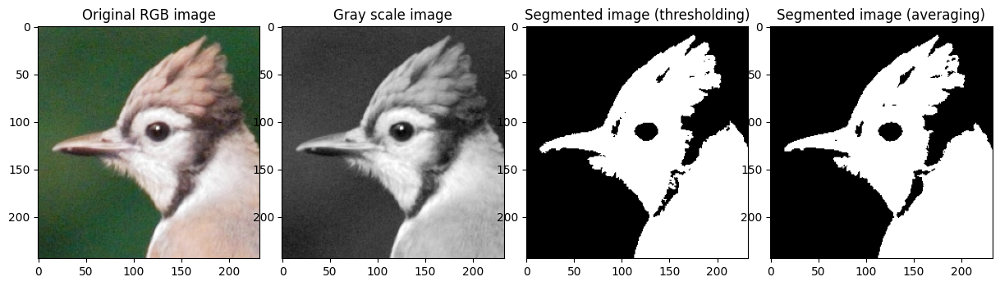

In [19]:
# define set of seed pixel points
x, y = 100, 100

# run region growing algorithm
seg_img = region_growing(gray_img, x, y, thresh=85, connectedness=4)
seg_img2 = region_growing_avg(gray_img, x, y, dist_thresh=85, connectedness=4)

# Show Original and segmented image
fig, axis = plt.subplots(1, 4, figsize=(15,15))
fig.subplots_adjust(wspace=0.1, hspace=0.05)
axis[0].imshow(img)
axis[0].set_title('Original RGB image')

axis[1].imshow(gray_img, 'gray')
axis[1].set_title('Gray scale image')

axis[2].imshow(seg_img, 'gray')
axis[2].set_title('Segmented image (thresholding)')

axis[3].imshow(seg_img2, 'gray')
axis[3].set_title('Segmented image (averaging)')
plt.show()

### More things to try out:
1. What kind of connectivity did you use for considering neighbour pixels? If you used 4- connectivity, try 8-connectivity, if you used 8-connectivity then try 4-connectivity.
    Does this change results?
    
2. What if there are multiple regions of interest? Consider using multiple seed points. How will you choose these?

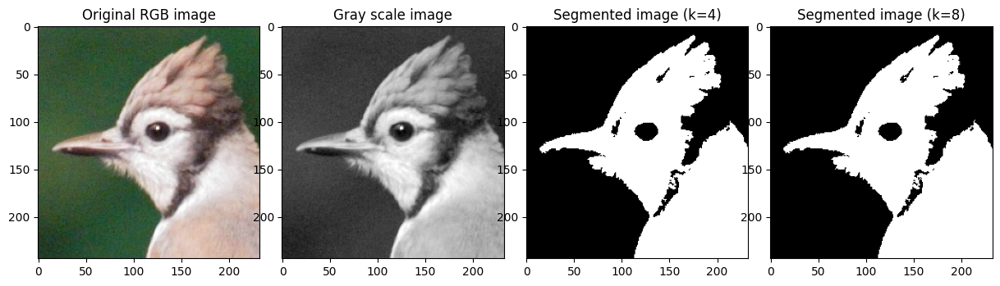

In [20]:
# define set of seed pixel points
x, y = 100, 100

# run region growing algorithm
seg_img = region_growing(gray_img, x, y, thresh=85, connectedness=4)
seg_img2 = region_growing(gray_img, x, y, thresh=85, connectedness=8)

# Show Original and segmented image
fig, axis = plt.subplots(1, 4, figsize=(15,15))
fig.subplots_adjust(wspace=0.1, hspace=0.05)
axis[0].imshow(img)
axis[0].set_title('Original RGB image')

axis[1].imshow(gray_img, 'gray')
axis[1].set_title('Gray scale image')

axis[2].imshow(seg_img, 'gray')
axis[2].set_title('Segmented image (k=4)')

axis[3].imshow(seg_img2, 'gray')
axis[3].set_title('Segmented image (k=8)')
plt.show()

0


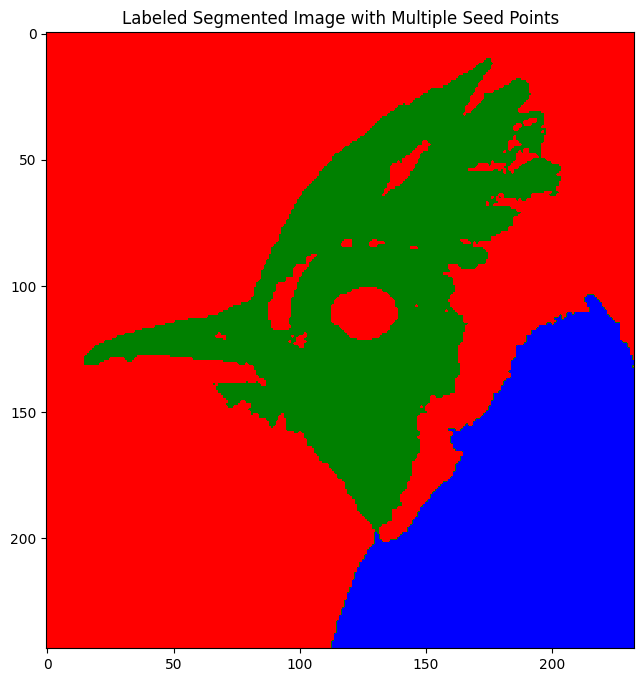

In [21]:


def region_growing_with_regions(img, num_regions, thresh=85, connectedness=4):
    """
    Region growing algorithm to segment a specified number of regions by growing from selected seed points.

    Parameters
    ----------
    img : np.ndarray
        Grayscale image (2D array).
    num_regions : int
        Number of regions to segment.
    thresh : int
        Intensity threshold for region growing.
    connectedness : int
        Either 4 or 8, indicating the type of connectivity.

    Returns
    -------
    segmented : np.ndarray
        Segmented image with unique labels for each region.
    """
    assert img.ndim == 2, "Expect a grayscale image!"
    assert connectedness in (4, 8), "Connectedness must be either 4 or 8!"

    H, W = img.shape
    segmented = np.zeros((H, W), dtype=np.uint8)

    neighbors = [(-1, 0), (1, 0), (0, -1), (0, 1)] if connectedness == 4 else \
                [(-1, 0), (1, 0), (0, -1), (0, 1), (-1, -1), (-1, 1), (1, -1), (1, 1)]

    # Automatically select seed points based on intensity peaks
    flat_indices = np.argsort(-img.ravel())  # Sort pixels by intensity (descending)
    seed_points = []
    visited = np.zeros_like(img, dtype=bool)

    for idx in flat_indices:
        x, y = divmod(idx, W)
        if len(seed_points) >= num_regions:
            break
        if not visited[x, y]:
            seed_points.append((x, y))
            # Mark nearby pixels to avoid selecting close seeds
            for dx, dy in neighbors:
                nx, ny = x + dx, y + dy
                if 0 <= nx < H and 0 <= ny < W:
                    visited[nx, ny] = True

    # Grow regions from selected seed points
    active_regions = {i + 1: deque([seed]) for i, seed in enumerate(seed_points)}
    region_sums = {i + 1: img[seed[0], seed[1]] for i, seed in enumerate(seed_points)}
    region_sizes = {i + 1: 1 for i in range(num_regions)}

    while active_regions:
        if not active_regions:
            break
        
        # Limit growing to ensure only `num_regions` regions exist
        for label in range(1, num_regions + 1):
            if label not in active_regions:
                continue

            if not active_regions[label]:
                del active_regions[label]
                continue

            cx, cy = active_regions[label].popleft()

            for dx, dy in neighbors:
                nx, ny = cx + dx, cy + dy
                if 0 <= nx < H and 0 <= ny < W and segmented[nx, ny] == 0:
                    pixel_intensity = img[nx, ny]
                    avg_intensity = region_sums[label] / region_sizes[label]
                    if abs(int(pixel_intensity) - avg_intensity) <= thresh:
                        segmented[nx, ny] = label
                        active_regions[label].append((nx, ny))
                        region_sums[label] += pixel_intensity
                        region_sizes[label] += 1

    print(len(active_regions))

    return segmented

segmented_img_labeled = region_growing_with_regions(gray_img, 2, thresh=85, connectedness=8)

from matplotlib.colors import ListedColormap

custom_cmap = ListedColormap(["red", "green", "blue"])

# Plotting the result
plt.figure(figsize=(8, 8))
plt.imshow(segmented_img_labeled, cmap=custom_cmap)
plt.title("Labeled Segmented Image with Multiple Seed Points")
plt.show()


## Task 3: Connected Components 

Connected-component labeling (also known as connected-component analysis, or region labeling) is an algorithmic application of graph theory that is used to determine the connectivity of “blob”-like regions in a binary image.
Specifically, the algorithm labels each connected component of a binary image with a separate number.

Similar to Region Growing, for a single connected-component we can start from a seed and iteratively traverse all the neighbouring pixels. In this case, a Depth-first Serach (DFS) is a better way:

Then we just need to repeat this process for all the connected components in the image.

In [22]:
import numpy as np

def connected_components_label(img, connectedness=4, min_component_size=1):
    """
    Label each connected component in a binary image with a unique number.
    
    Parameters:
    - img: np.ndarray
        A binary image where pixels are either 0 or 1.
    - connectedness: int
        Can be 4 or 8, determining the neighborhood connectivity.
        
    Returns:
    - labeled_img: np.ndarray
        An image with each connected component labeled with a unique integer.
    """
    rows, cols = img.shape
    
    # Define neighbor offsets for 4-connectivity and 8-connectivity
    if connectedness == 4:
        neighbors = [(-1, 0), (1, 0), (0, -1), (0, 1)]  # N, S, W, E
    elif connectedness == 8:
        neighbors = [(-1, 0), (1, 0), (0, -1), (0, 1), 
                     (-1, -1), (-1, 1), (1, -1), (1, 1)]  # Diagonals included
    else:
        raise ValueError("Connectedness must be either 4 or 8.")
    
    labeled_img = np.zeros_like(img, dtype=int)
    current_label = 1

    def dfs(r, c):
        """Depth-first search to label connected components."""
        stack = [(r, c)]
        component_size = 0
        while stack:
            component_size += 1
            cr, cc = stack.pop()
            if labeled_img[cr, cc] == 0:  # Not visited
                labeled_img[cr, cc] = current_label
                for dr, dc in neighbors:
                    nr, nc = cr + dr, cc + dc
                    if 0 <= nr < rows and 0 <= nc < cols:  # Within bounds
                        if img[nr, nc] == 1 and labeled_img[nr, nc] == 0:
                            stack.append((nr, nc))
        return component_size
    
    for r in range(rows):
        for c in range(cols):
            if img[r, c] == 1 and labeled_img[r, c] == 0:  # Found a new component
                
                component_size = dfs(r, c)
                if component_size > min_component_size:
                    current_label += 1

    print(current_label)
    return labeled_img


12


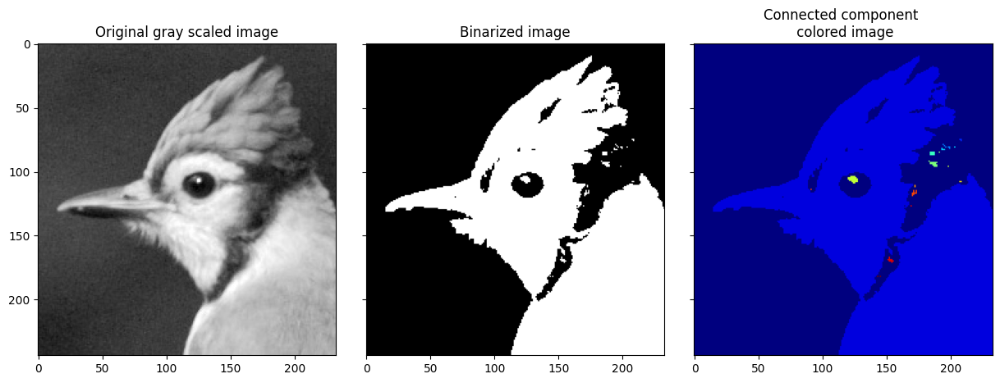

In [23]:
from matplotlib import cm

def colourize(label_img):
    """
    Maps a labeled image to RGB colors for visualization.

    Parameters:
    - label_img: np.ndarray
        Labeled image with integer labels.

    Returns:
    - np.ndarray: RGB image for visualization.
    """
    unique_labels = np.unique(label_img)
    max_label = unique_labels.max()
    # Normalize labels to a 0-1 range
    normalized_labels = label_img / max_label if max_label > 0 else label_img
    # Use a colormap to generate an RGB image
    return cm.jet(normalized_labels)

bimg = (gray_img > 100).astype(np.float32)
ccl_img = connected_components_label(bimg)

fig, axis = plt.subplots(1, 3, figsize=(15,10), sharey=True)
fig.subplots_adjust(wspace=0.1, hspace=0.05)
axis[0].imshow(gray_img, 'gray')
axis[0].set_title('Original gray scaled image')

axis[1].imshow(bimg, 'gray')
axis[1].set_title('Binarized image')

axis[2].imshow(colourize(ccl_img))
axis[2].set_title('Connected component \n colored image')
plt.show()

The previous image was not a very good example to showcase the connected component algorithm. Next, you will see a better image.

17


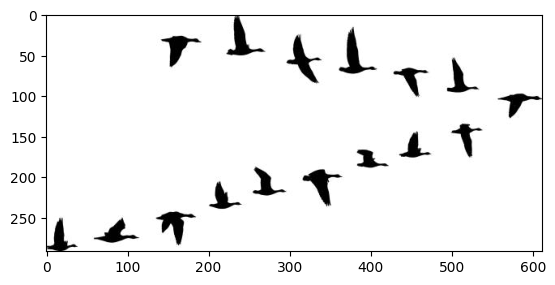

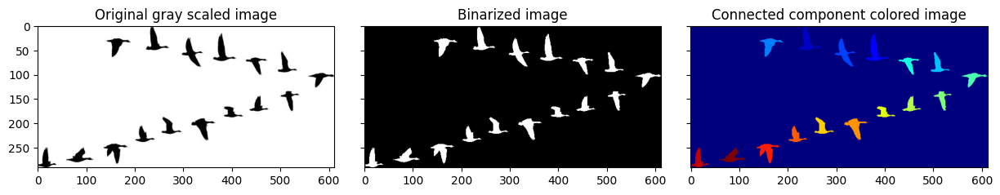

In [24]:
img2 = cv2.imread("../dataset/gooses.jpg")
gray_img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY).astype(np.float32)
plt.imshow(gray_img2, 'gray')

bimg2 = (gray_img2 < 100).astype(np.float32)
ccl_img2 = connected_components_label(bimg2)

fig, axis = plt.subplots(1, 3, figsize=(15,10), sharey=True)
fig.subplots_adjust(wspace=0.1, hspace=0.05)
axis[0].imshow(gray_img2, 'gray')
axis[0].set_title('Original gray scaled image')

axis[1].imshow(bimg2, 'gray')
axis[1].set_title('Binarized image')

axis[2].imshow(colourize(ccl_img2))
axis[2].set_title('Connected component colored image')
plt.show()

### Tasks
Your task is to count the number of candies in the image below (Candy1):
1. Show your code and intermediate results for each step
2. Explain how the parameters were selected and what prior information you use.
3. Report your answer
4. Try your code on Candy2 without anychanges and report reuslt, discuss how would you improve the method for them.

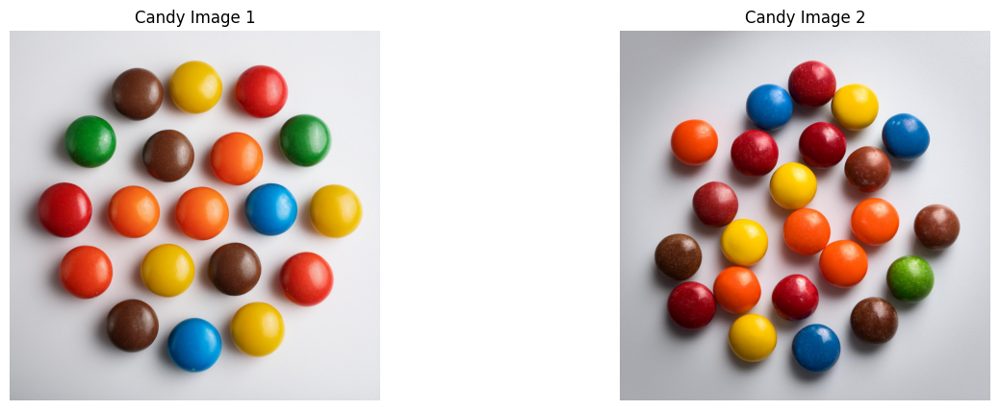

21


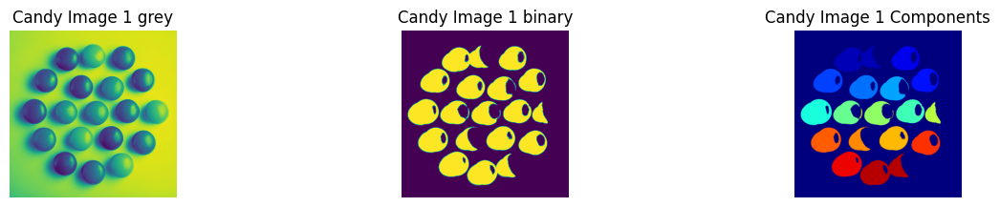

19


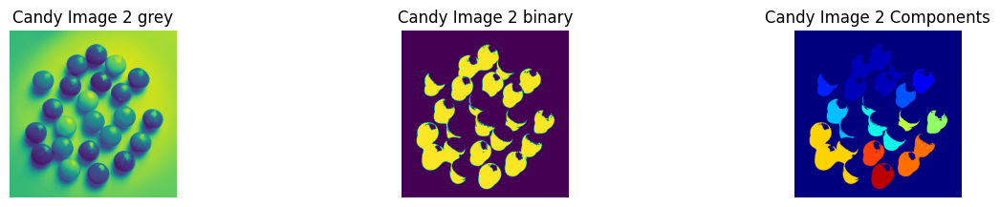

In [25]:
# Read first candy image
img1 = cv2.imread('../dataset/candy1.jpeg')
# Convert BGR to RGB for correct color display
img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

# Read second candy image
img2 = cv2.imread('../dataset/candy2.jpeg')
# Convert BGR to RGB for correct color display
img2_rgb = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

# Create figure with two subplots side by side
plt.figure(figsize=(15, 5))

# Display first image
plt.subplot(1, 2, 1)
plt.imshow(img1_rgb)
plt.title('Candy Image 1')
plt.axis('off')

# Display second image
plt.subplot(1, 2, 2)
plt.imshow(img2_rgb)
plt.title('Candy Image 2')
plt.axis('off')

plt.show()

plt.figure(figsize=(15, 5))

gray_img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY).astype(np.float32)

# Display second image
plt.subplot(2, 3, 1)
plt.imshow(gray_img1)
plt.title('Candy Image 1 grey')
plt.axis('off')

bimg1 = (gray_img1 < 150).astype(np.float32)

plt.subplot(2, 3, 2)
plt.imshow(bimg1)
plt.title('Candy Image 1 binary')
plt.axis('off')

ccl_img1 = connected_components_label(bimg1, connectedness=8, min_component_size=40*40)

plt.subplot(2, 3, 3)
plt.imshow(colourize(ccl_img1))
plt.title('Candy Image 1 Components')
plt.axis('off')

plt.show()

plt.figure(figsize=(15, 5))

gray_img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY).astype(np.float32)

# Display second image
plt.subplot(2, 3, 1)
plt.imshow(gray_img2)
plt.title('Candy Image 2 grey')
plt.axis('off')

bimg2 = (gray_img2 < 100).astype(np.float32)

plt.subplot(2, 3, 2)
plt.imshow(bimg2)
plt.title('Candy Image 2 binary')
plt.axis('off')

ccl_img2 = connected_components_label(bimg2, connectedness=8, min_component_size=10*10)

plt.subplot(2, 3, 3)
plt.imshow(colourize(ccl_img2))
plt.title('Candy Image 2 Components')
plt.axis('off')

plt.show()

# Part 2: Filter
In the last lecture you learned about linear image filtering operations like correlation and
convolution and how these can be applied directly on the image.
These kind of filtering operations have many uses, ranging from smoothing and noise
reduction, to feature enhancement and sharpening, calculating image derivatives, edge
detection and even template matching.
Your task today is to code your own linear filtering functions operating on the image domain.

In [26]:
import numpy as np
import cv2
import matplotlib.image as mpimg
from matplotlib import pyplot as plt
# to visualize the plots within the notebook
%matplotlib inline

## Task 4 Convolution
Convolution is a fundamental operation for applying linear filters to images. It takes as input
an image (greyscale) I and a filter kernel K and returns the result I’ of convolving the image
with this filter.

Definition: Given a greyscale image I and a filter K of size (2N + 1) x (2M + 1) (we use odd
dimension filters like 3 x 3, 5 x 5 etc.), convolution is defined as:

\begin{equation}
I'(x, y) = \sum_{i=-a}^a \sum_{j=-b}^b K(i, j) I(x - i, y - j)
\end{equation}

Your task is to write your own convolution function (do not use the conv2() function) and test
it with different filters. How will you handle the behaviour of the filter in the edges of the
image (pad with zeros, copy the edge etc.)?

Smoothing filters that reduce noise in images are quite useful in image processing. Use a
simple mean filter like:

\begin{equation}
\begin{bmatrix}1 & 1 & 1\\1 & 1 & 1\\1 & 1 & 1\end{bmatrix}
\end{equation}

This filter replaces each pixel by the average of its neighbourhood. Now if we want
something better, we can try weighing the contributions of the neighbouring pixels by their
proximity to the centre pixel. Try a Gaussian filter, which is defined as: 

\begin{equation}
G_{\sigma} = \frac{1}{2\pi \sigma^2} e^{-\frac{(x^2 + y^2)}{2 \sigma^2}}
\end{equation}

where $\sigma$ is the standard deviationof the Gaussian. This is a continuous function, so your filter will need to sample it in both x and y directions (use np.meshgrid()), keeping in mind the value for $\sigma$ that you chose. Try different filter sizes and different values for $\sigma$ and compare the results. Here is the results obtained using opencv built-in functions. If your implementation is correct, you should expect to have similar results.

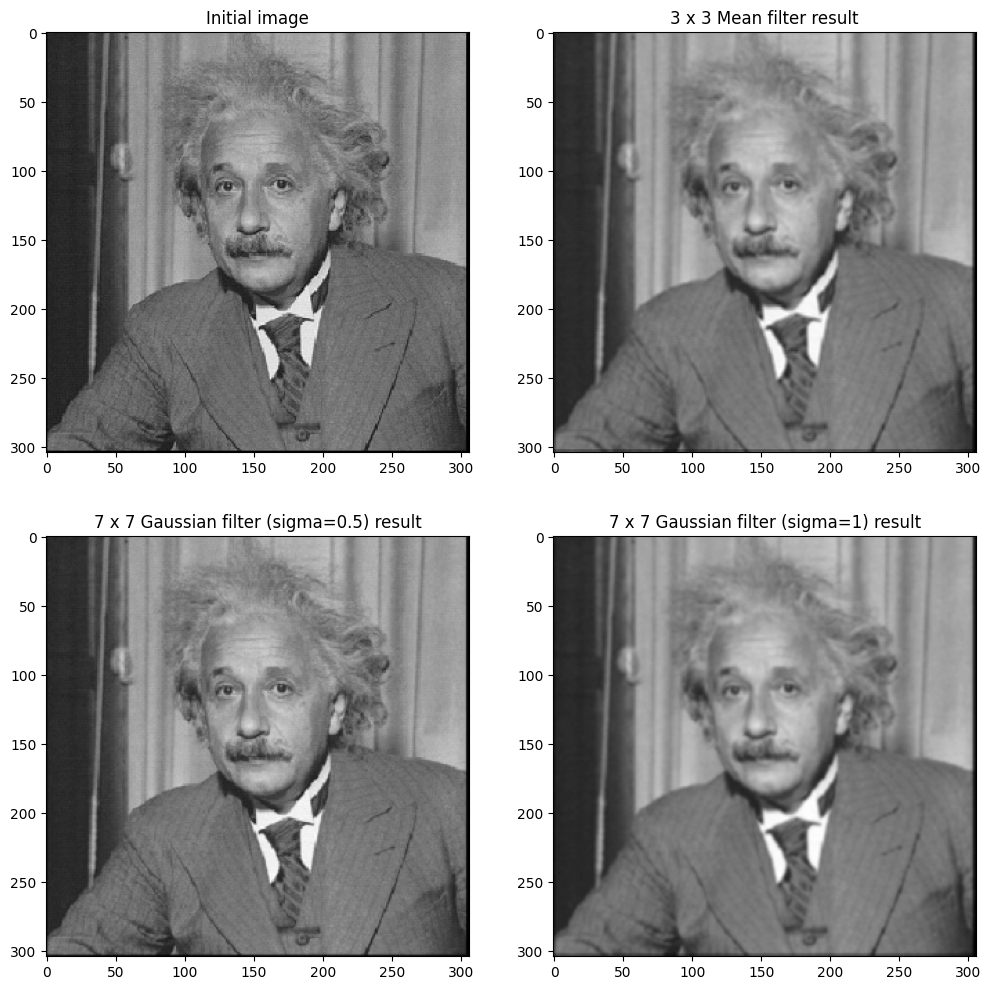

In [27]:
img = cv2.imread("../dataset/einstein.png")
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(np.float32)
mean_blur = cv2.blur(img_gray, (3, 3))  # mean filter 3x3
gaussian_1 = cv2.GaussianBlur(img_gray, (7, 7), 0.5, 0.5)  # gaussian filter 7x7, sigma = 0.5
gaussian_2 = cv2.GaussianBlur(img_gray, (7, 7), 1., 1.)  # gaussian filter 7x7, sigma = 1.0
fig = plt.figure(figsize=(12, 12))
ax1 = plt.subplot(2, 2, 1)
ax1.title.set_text("Initial image")
plt.imshow(img_gray, "gray")
ax2 = plt.subplot(2, 2, 2)
ax2.title.set_text("3 x 3 Mean filter result")
plt.imshow(mean_blur, "gray")
ax3 = plt.subplot(2, 2, 3)
ax3.title.set_text("7 x 7 Gaussian filter (sigma=0.5) result")
plt.imshow(gaussian_1, "gray")
ax4 = plt.subplot(2, 2, 4)
ax4.title.set_text("7 x 7 Gaussian filter (sigma=1) result")
plt.imshow(gaussian_2, "gray")
plt.show()

### Implement your own code here:

hint: You can use `cv2.copyMakeBorder` to do paddings to the image. Figure out how to use it by yourself!

In [28]:
import cv2
import numpy as np

def apply_filter(src_img, kernel):
    '''
    Apply filtering algorithm manually.
    :param src_img: gray scaled source image with size HxW
    :param kernel: kernel to be applied to the source image
    :return rst_img: filtered image
    '''
    assert len(src_img.shape) == 2, "Dimension mismatch! Please supply gray-scale image only!"
    assert len(kernel.shape) == 2, "Dimension mismatch! Please supply 2D kernel only!"
    
    # Get kernel dimensions
    kh, kw = kernel.shape
    pad_h, pad_w = kh // 2, kw // 2  # Padding size
    
    # Add padding to the input image
    padded_img = cv2.copyMakeBorder(src_img, pad_h, pad_h, pad_w, pad_w, borderType=cv2.BORDER_REFLECT)
    
    # Prepare an empty output image
    rst_img = np.zeros_like(src_img, dtype=np.float32)
    
    # Perform convolution manually
    for i in range(rst_img.shape[0]):
        for j in range(rst_img.shape[1]):
            # Extract the region of interest
            roi = padded_img[i:i+kh, j:j+kw]
            # Apply the kernel to the region
            rst_img[i, j] = np.sum(roi * kernel)
    
    return rst_img


def get_mean_filter_kernel(h, w):
    '''
    Get kernel of mean filter
    :param h: height of the kernel
    :param w: width of the kernel
    :return: mean filter kernel
    '''
    assert (h > 0 and w > 0), "Kernel dimensions must be positive integers!"
    
    # Create a mean filter kernel
    kernel = np.ones((h, w), dtype=np.float32) / (h * w)
    return kernel


def get_gaussian_kernel(h, w, sigma):
    '''
    Get kernel of Gaussian filter
    :param h: height of the kernel
    :param w: width of the kernel
    :param sigma: standard deviation of the Gaussian
    :return: Gaussian filter kernel
    '''
    assert (h % 2 == 1) and (w % 2 == 1), "Kernel size must be odd numbers!"
    
    # Create Gaussian kernel
    center_h, center_w = h // 2, w // 2
    y, x = np.meshgrid(np.arange(h) - center_h, np.arange(w) - center_w, indexing="ij")
    kernel = np.exp(-(x**2 + y**2) / (2 * sigma**2))
    kernel /= kernel.sum()  # Normalize the kernel so the sum is 1
    return kernel


In [29]:
"""
Get kernels and apply filter here
"""
k_mean = get_mean_filter_kernel(3, 3)
G1 = get_gaussian_kernel(7, 7, 0.5)
G2 = get_gaussian_kernel(7, 7, 1.)
img_mean_blur = apply_filter(img_gray, k_mean)
img_gaussian_1 = apply_filter(img_gray, G1)
img_gaussian_2 = apply_filter(img_gray, G2)


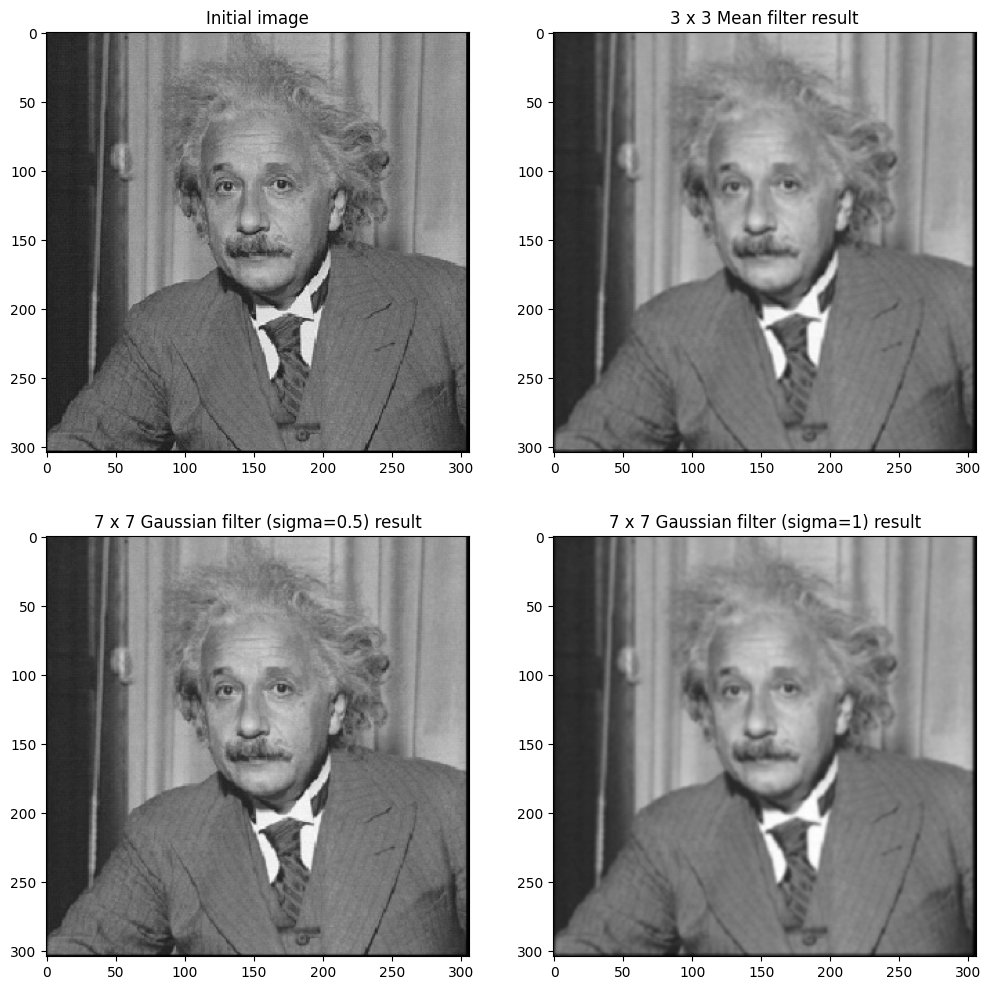

In [30]:

"""
Plot the results
"""
fig = plt.figure(figsize=(12, 12))
ax1 = plt.subplot(2, 2, 1)
ax1.title.set_text("Initial image")
plt.imshow(img_gray, "gray")
ax2 = plt.subplot(2, 2, 2)
ax2.title.set_text("3 x 3 Mean filter result")
plt.imshow(img_mean_blur, "gray")
ax3 = plt.subplot(2, 2, 3)
ax3.title.set_text("7 x 7 Gaussian filter (sigma=0.5) result")
plt.imshow(img_gaussian_1, "gray")
ax4 = plt.subplot(2, 2, 4)
ax4.title.set_text("7 x 7 Gaussian filter (sigma=1) result")
plt.imshow(img_gaussian_2, "gray")
plt.show()

## Task 5: Edge Detection with Sobel Filter
The Sobel filter is commonly used to detect edges in images by calculating the gradient of the image intensity. It emphasizes areas of high spatial frequency that correspond to edges. Here, we will apply the Sobel filter to detect edges in the grayscale image of Albert Einstein.

We start by applying separate Sobel filters in both the x and y directions, which will highlight horizontal and vertical edges, respectively. The combined result will provide a comprehensive edge map of the entire image.



### Tasks:
* Use your own kenel and extract edge on x and y with sobel filter with only numpy.
* Using the package - *time* does your algorithm compare to the built-in median filtering of opencv? Also, measure the time difference and compare result from your implementation and opencv

In [31]:
def sobel_filter(src_img):
    '''
    Apply Sobel filter to detect edges
    :param src_img: gray scaled source image with size HxW
    :return sobel_magnitude: magnitude of the Sobel gradient
    '''
    assert len(src_img.shape) == 2, "Dimension mismatch! Please supply gray-scale image only!"
    
    # Sobel kernels for x and y directions
    sobel_x = np.array([[-1, 0, 1],
                        [-2, 0, 2],
                        [-1, 0, 1]], dtype=np.float32)
    
    sobel_y = np.array([[-1, -2, -1],
                        [ 0,  0,  0],
                        [ 1,  2,  1]], dtype=np.float32)
    
    # Apply Sobel kernels
    gradient_x = apply_filter(src_img, sobel_x)
    gradient_y = apply_filter(src_img, sobel_y)
    
    # Calculate the gradient magnitude
    sobel_magnitude = np.sqrt(gradient_x**2 + gradient_y**2)
    sobel_magnitude = (sobel_magnitude / sobel_magnitude.max()) * 255  # Normalize to 0-255
    
    return sobel_magnitude, gradient_x, gradient_y

Custom Sobel filter time: 0.914753 seconds
OpenCV Sobel filter time: 0.000670 seconds


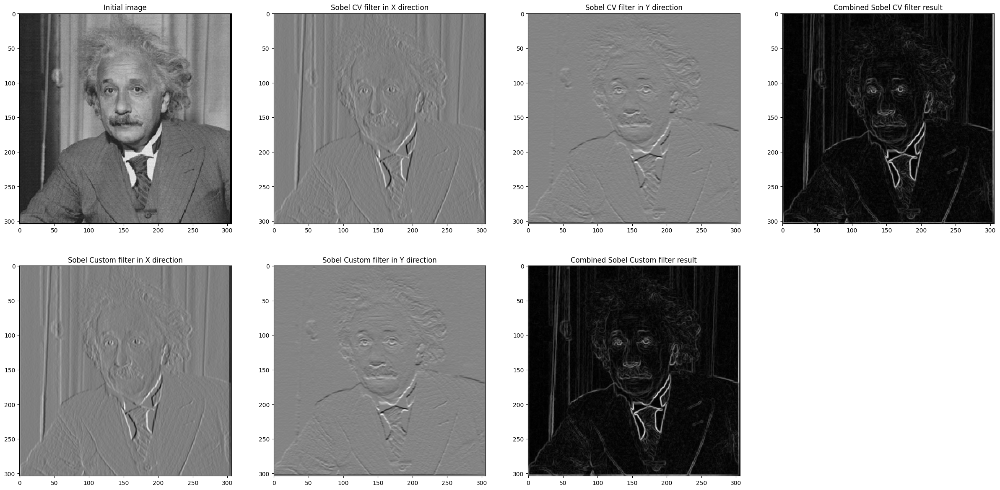

In [32]:
import time

img = cv2.imread("../dataset/einstein.png")
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(np.float32)

# Measure time for custom Sobel filter
start_time = time.time()
sobel_custom, sobel_custom_x, sobel_custom_y = sobel_filter(img_gray)
custom_time = time.time() - start_time

# Measure time for OpenCV Sobel filter
start_time = time.time()
sobel_x = cv2.Sobel(img_gray, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(img_gray, cv2.CV_64F, 0, 1, ksize=3)
sobel_opencv = cv2.magnitude(sobel_x, sobel_y)
opencv_time = time.time() - start_time

# Compare performance
print(f"Custom Sobel filter time: {custom_time:.6f} seconds")
print(f"OpenCV Sobel filter time: {opencv_time:.6f} seconds")

fig = plt.figure(figsize=(30, 30))
ax1 = plt.subplot(4, 4, 1)
ax1.title.set_text("Initial image")
plt.imshow(img_gray, "gray")
ax2 = plt.subplot(4, 4, 2)
ax2.title.set_text("Sobel CV filter in X direction")
plt.imshow(sobel_x, "gray")
ax3 = plt.subplot(4, 4, 3)
ax3.title.set_text("Sobel CV filter in Y direction")
plt.imshow(sobel_y, "gray")
ax4 = plt.subplot(4, 4, 4)
ax4.title.set_text("Combined Sobel CV filter result")
plt.imshow(sobel_opencv, "gray")
ax5 = plt.subplot(4, 4, 5)
ax5.title.set_text("Sobel Custom filter in X direction")
plt.imshow(sobel_x, "gray")
ax5 = plt.subplot(4, 4, 6)
ax5.title.set_text("Sobel Custom filter in Y direction")
plt.imshow(sobel_y, "gray")
ax6 = plt.subplot(4, 4, 7)
ax6.title.set_text("Combined Sobel Custom filter result")
plt.imshow(sobel_custom, "gray")
plt.show()


# Part 3: Corner Detection

In the second lecture of the week we went through about corner detection algorithms and how these can be used to find
interesting features on an image that can be used in applications such as stereo matching,
3D reconstruction, tracking, localization and recognition.
Our task here is to code two corner detection algorithms, the Moravec and the Harris
corner detector.

In [33]:
import numpy as np
import copy
import cv2
from matplotlib import pyplot as plt
import random
from PIL import Image
#to visualize the plots within the notebook
%matplotlib inline
# for making plots looking nicer
plt.style.use('fivethirtyeight')

## Task 6: Moravec corner detector

The Moravec corner detector uses a patch centred on each pixel as its own matching
template. The patch is shifted so that it is centred on each of the 8 neighbours of the pixel
and the sum of squared differences (SSD) is calculated between the original patch and the
shifted patch:

$$
    E = \sum_{\Delta \mathbf{x}} w(\Delta \mathbf{x})\big(I(\mathbf{x} + \Delta \mathbf{x}) - I(\mathbf{x}^{\prime} + \Delta \mathbf{x}\big)^2
$$


$w$ is a weighting function with the same dimension as the patch, you can use a Gaussian or constant weights. The corner metric (cornerness) is then taken to be the minimum of the SSD values calculated for each of the eight shifts of the window.
A pixel is marked as a corner if its cornerness is above a user-specified threshold.


Your task is to write your implementation of the Moravec corner detector.
It will take as input a grayscale image, the window size, the threshold and optionally a Gaussian function for $w$. It will give as output a corner map as a list of pixel coordinates where a corner is detected.


In [34]:
def draw_corners(image, corners_map, color=(255, 0, 0)):
    """Draw a point for each possible corner.
    color image: [H, W, 3]
    corners_map: list of pixel coordinates (xy indexing)
    """
    
    color_img = cv2.cvtColor(image[:,:,0], cv2.COLOR_GRAY2BGR)
    for corner in corners_map:
        cv2.circle(color_img, corner, 1, color, -1)
    return color_img

def make_mean_filter_kernel(h, w):
    return np.ones((h, w)) / (h * w)

def make_gaussian_kernel(h, w, sigma):
    assert (h % 2 == 1) and (w % 2 == 1), print("kernal size must be odd number!")
    
    x = np.arange(-(h // 2), h // 2 + 1, 1.)
    y = np.arange(-(w // 2), w // 2 + 1, 1.)
    xx, yy = np.meshgrid(x, y)
    two_sigma_2 = 2 * sigma ** 2
    G = np.exp(-(xx ** 2 + yy ** 2) / two_sigma_2) / (two_sigma_2 * np.pi)
    G /= G.sum()
    return G

def SSD(patch1, patch2, weight):
    return (weight * (patch1 - patch2) ** 2).sum()

def moravec(image, window_size=3, threshold=100., weights=None):
    """Moravec's corner detection for each pixel of the image.
    image: grayscale image: [H, W]
    """
    assert window_size % 2 == 1, "window size should be an odd number"
    
    neighbours = [(-1, 0), (1, 0), (0, -1), (0, 1), (-1, -1), (-1, 1), (1, -1), (1, 1)]
    if weights is None:
        weights = make_mean_filter_kernel(window_size, window_size)
    
    corners = []
    k = window_size // 2
    H, W = image.shape[0], image.shape[1]
    for i in range(0, H):
        for j in range(0, W):
            if i-k < 0 or j-k < 0 or i+k >= H or j+k >= W:
                continue
            centre_patch = image[i-k:i+k+1, j-k:j+k+1]
            E = []
            for nei in neighbours:
                di, dj = nei
                ii, jj = i + di, j + dj
                if ii-k < 0 or jj-k < 0 or ii+k >= H or jj+k >= W:
                    continue
                patch = image[ii-k:ii+k+1, jj-k:jj+k+1]
                E.append(SSD(centre_patch, patch, weights))
            minE = np.array(E).min()
            if minE > threshold:
                corners.append((j, i))

    return corners

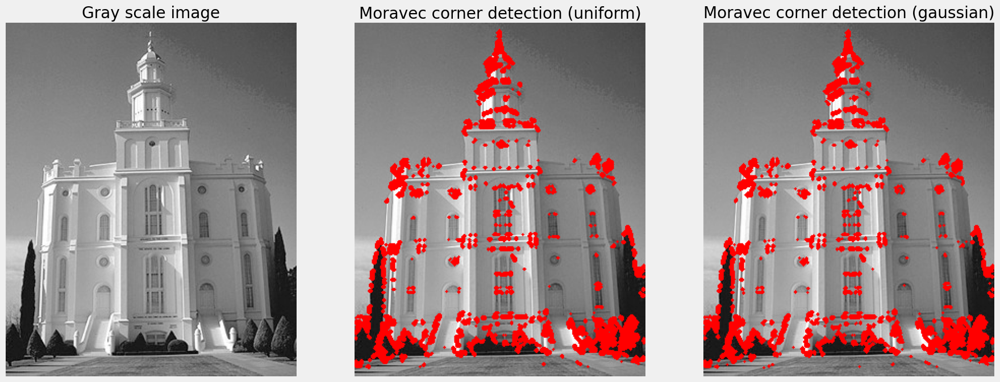

In [35]:
img = cv2.imread('../dataset/building.png')
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(np.float32)

moravec_corners = moravec(gray_img, threshold=200.)
img_with_corner = draw_corners(img, moravec_corners)

moravec_corners2 = moravec(gray_img, threshold=200., weights=make_gaussian_kernel(3, 3, 1.0))
img_with_corner2 = draw_corners(img, moravec_corners2)

# Show Original and detected corners on image
fig, axis = plt.subplots(1, 3, figsize=(20, 8), sharey=False)
axis[0].imshow(gray_img, 'gray')
axis[0].grid(False)
axis[0].set_title('Gray scale image')
axis[0].set_axis_off()

axis[1].imshow(img_with_corner, 'gray')
axis[1].grid(False)
axis[1].set_title('Moravec corner detection (uniform)')
axis[1].set_axis_off()

axis[2].imshow(img_with_corner2, 'gray')
axis[2].grid(False)
axis[2].set_title('Moravec corner detection (gaussian)')
axis[2].set_axis_off()

plt.show()

## Task 7: Harris corner detector

The Harris corner detector builds upon the concepts of the Moravec corner detector, but
overcomes its limitations by generalising the measure of cornerness.
The basic limitation of the Moravec detector is that it only calculates cornerness for the 8 main directions
corresponding to the neighbours of a pixel, which means it will not detect a corner in any other direction.
The Harris detector uses the image structure tensor to overcome this. The image structure tensor is:

$$
    S = 
    \begin{pmatrix}
     I^2_x   & I_x I_y\\
     I_x I_y & I^2_y
    \end{pmatrix}
$$

where $I_x$ is the partial derivative of the image in the x direction and $I_y$ is the partial derivative of the image in the y direction.
The structure tensor summarizes the main directions of the gradient of the image for every pixel and therefore its two eigenvalues can be used to determine whether there is a corner at a pixel (if both eigenvalues are large).
The cornerness response metric is then defined as follows:

$$
    C = \text{det}(S) - k \text{tr}(S)^2 \\
$$

where $k$ is a an empirically determined hyper-parameter, usually in the range of $[0.04, 0.06]$

### Non-maximum Suppression (NMS)

In most cases, naivly thresholding the response map will lead to a lot of false-positives, i.e. blobs around real corners. One way to mitigate this to use Non-maximum Suppression (NMS). There is a number of ways of doing it, but the principle is to only keep the pixel with maxium response for aby local regions. You can try by simply setting pixels that have an 8 neighbour with higher cornerness to zero.

In [36]:
"""
Utility functions here, you can use code from the last week. FFT implementation is reccomended as it is faster.
"""
def apply_filter(src_img, kernel):
    kh, kw = kernel.shape
    pad_h, pad_w = kh // 2, kw // 2
    padded_img = cv2.copyMakeBorder(src_img, pad_h, pad_h, pad_w, pad_w, borderType=cv2.BORDER_REFLECT)
    filtered_img = np.zeros_like(src_img, dtype=np.float32)
    for i in range(src_img.shape[0]):
        for j in range(src_img.shape[1]):
            region = padded_img[i:i + kh, j:j + kw]
            filtered_img[i, j] = np.sum(region * kernel)
    return filtered_img


def apply_gaussian_filter(src_img, k=5, sigma=1.0):
    kernel = make_gaussian_kernel(k, k, sigma)
    return apply_filter(src_img, kernel)


def gradientX(image):
    kernel = np.array([[-1., 0., 1.],
                       [-2., 0., 2.],
                       [-1., 0., 1.]]) / 9.
    filtered_image = apply_filter(image, kernel)
    return filtered_image

def gradientY(image):
    kernel = np.array([[-1., -2., -1.],
                       [0., 0., 0.],
                       [1., 2., 1.]]) / 9.
    filtered_image = apply_filter(image, kernel)
    return filtered_image


def nms(response, threshold, window_size=3):
    corners = []
    H, W = response.shape
    half_win = window_size // 2
    for i in range(half_win, H - half_win):
        for j in range(half_win, W - half_win):
            patch = response[i - half_win:i + half_win + 1, j - half_win:j + half_win + 1]
            if response[i, j] == patch.max() and response[i, j] > threshold:
                corners.append((j, i))  # x, y indexing
    return corners

def harris(image, k=0.05, threshold=2000.):
    # Compute gradients
    Ix = gradientX(image)
    Iy = gradientY(image)
    
    # Compute products of gradients
    Ix2 = apply_gaussian_filter(Ix ** 2, k=3, sigma=1.0)
    Iy2 = apply_gaussian_filter(Iy ** 2, k=3, sigma=1.0)
    Ixy = apply_gaussian_filter(Ix * Iy, k=3, sigma=1.0)
    
    # Compute Harris response
    det_M = Ix2 * Iy2 - Ixy ** 2
    trace_M = Ix2 + Iy2
    response = det_M - k * (trace_M ** 2)
    
    # Thresholding for corners
    corners = np.argwhere(response > threshold)
    corners = [tuple(pt[::-1]) for pt in corners]  # Convert to (x, y) indexing
    return corners, response

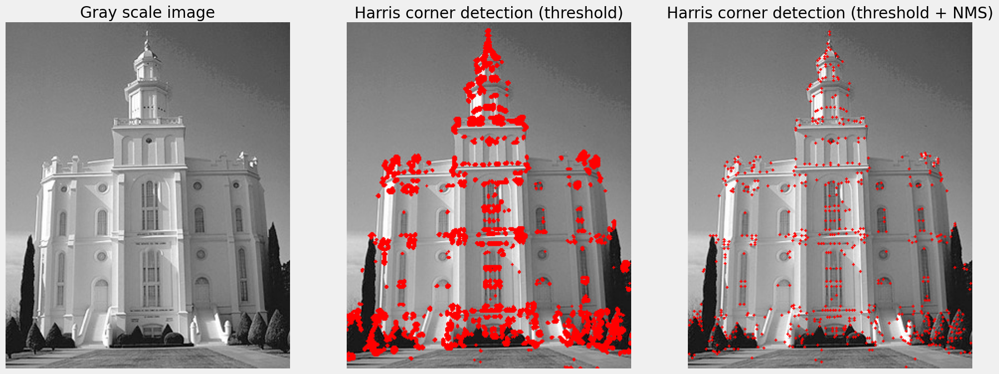

In [37]:
img = cv2.imread('../dataset/building.png')
k = 0.05
threshold = 2000.
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(np.float32)
H, W = gray_img.shape
#Write your code here:

# Apply Harris corner detection
corners, response = harris(gray_img, k=k, threshold=threshold)
harris_img_corner = draw_corners(img, corners)

# Apply Non-Maximum Suppression (NMS)
corners_nms = nms(response, threshold=threshold, window_size=3)
harris_img_corner_nms = draw_corners(img, corners_nms)

# Show Original and detected corners on image
fig, axis = plt.subplots(1, 3, figsize=(20, 8), sharey=False)
axis[0].imshow(gray_img, 'gray')
axis[0].grid(False)
axis[0].set_title('Gray scale image')
axis[0].set_axis_off()

axis[1].imshow(harris_img_corner, 'gray')
axis[1].grid(False)
axis[1].set_title('Harris corner detection (threshold)')
axis[1].set_axis_off()

axis[2].imshow(harris_img_corner_nms, 'gray')
axis[2].grid(False)
axis[2].set_title('Harris corner detection (threshold + NMS)')
axis[2].set_axis_off()

plt.show()

# Part 4 Feature extraction and Matching


## Task 8 SIFT Feature Detection and Matching

#### Step 1: SIFT Feature Detection and Visualization
Here we demonstrates how SIFT detects features in a single image:
- Loads and preprocesses the image
- Detects SIFT keypoints
- Visualizes the keypoints on the image
- Shows keypoint orientations and scales

#### Step 2: Feature Matching Between Images
Here we show how SIFT features are matched between two images:
- Detects features in both images
- Matches features using ratio test
- Visualizes the matching results with lines connecting matched points
- Shows match distance distribution

### Tasks:

1. With the example provided:
   1.  Vary the paratmeter on  'max_image_size', 'max_features', 'ratio_thresh' to see their impact on perforamnce, such as matching reuslt and time consumption.

2. Capture your own image pair with:
   1. Slight variation of angle and match them
   2. Big variation of angle and match them
   3. Different time of the day or lighting variation and match them
   4. With one image using your phone or laptop webcam and match them

3. Compare Harris detector result with SIFT and FAST (https://docs.opencv.org/3.4/df/d0c/tutorial_py_fast.html)


In [38]:
import cv2
import time
import numpy as np
import matplotlib.pyplot as plt

#### Common Functions

In [39]:
# Common Functions
def load_image(image_path, max_size):
    """Load and resize image if too large"""
    img = cv2.imread(image_path)
    if img is None:
        raise FileNotFoundError(f"Could not load image: {image_path}")
    
    # Resize if image is too large
    h, w = img.shape[:2]
    if max(h, w) > max_size:
        scale = max_size / max(h, w)
        new_size = (int(w * scale), int(h * scale))
        img = cv2.resize(img, new_size, interpolation=cv2.INTER_AREA)
    
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    return img_gray, img_rgb

def visualize_features(img_rgb, keypoints, title="SIFT Features"):
    """Visualize SIFT features with circles and orientations"""
    img_with_kp = img_rgb.copy()
    
    for kp in keypoints:
        x, y = int(kp.pt[0]), int(kp.pt[1])
        size = int(kp.size)
        angle = kp.angle * np.pi / 180.0
        
        cv2.circle(img_with_kp, (x, y), size, (0, 255, 0), 1)
        end_x = int(x + size * np.cos(angle))
        end_y = int(y + size * np.sin(angle))
        cv2.line(img_with_kp, (x, y), (end_x, end_y), (0, 255, 0), 1)
    
    plt.figure(figsize=(12, 8))
    plt.imshow(img_with_kp)
    plt.title(f"{title}\n{len(keypoints)} keypoints detected")
    plt.axis('off')
    plt.tight_layout()

    
def visualize_matches(img1_rgb, img2_rgb, keypoints1, keypoints2, good_matches, 
                     distances, max_display_matches):
    """Visualize feature matches between images"""
    good_matches = sorted(good_matches, key=lambda x: x.distance)[:max_display_matches]
    
    plt.figure(figsize=(12, 6))
    
    # Plot histogram
    plt.subplot(1, 2, 1)
    plt.hist(distances, bins=30, color='blue', alpha=0.7)
    plt.title(f"Match Distances\n({len(good_matches)} shown of {len(distances)} matches)")
    plt.xlabel("Distance")
    plt.ylabel("Count")
    
    # Draw matches
    match_img = cv2.drawMatches(
        img1_rgb, keypoints1,
        img2_rgb, keypoints2,
        good_matches, None,
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS,
        matchColor=(0, 255, 0)
    )
    
    plt.subplot(1, 2, 2)
    plt.imshow(match_img)
    plt.title("SIFT Matches")
    plt.axis('off')
    plt.tight_layout()


In [40]:
def detect_features(img, max_features):
    """Detect SIFT features"""
    sift = cv2.SIFT_create(nfeatures=max_features)
    keypoints, descriptors = sift.detectAndCompute(img, None)
    return keypoints, descriptors


In [41]:
def match_features(descriptors1, descriptors2, ratio_thresh):
    """Match features using BFMatcher with ratio test"""
    bf = cv2.BFMatcher(cv2.NORM_L2)
    matches = bf.knnMatch(descriptors1, descriptors2, k=2)
    
    good_matches = []
    distances = []
    for m, n in matches:
        if m.distance < ratio_thresh * n.distance:
            good_matches.append(m)
            distances.append(m.distance)
    
    return good_matches, distances

#### Extract Feature Points


=== Stage 1: Single Image SIFT Detection ===
Image size: (554, 800, 3)


Processing time: 0.290 seconds
Features detected: 1000


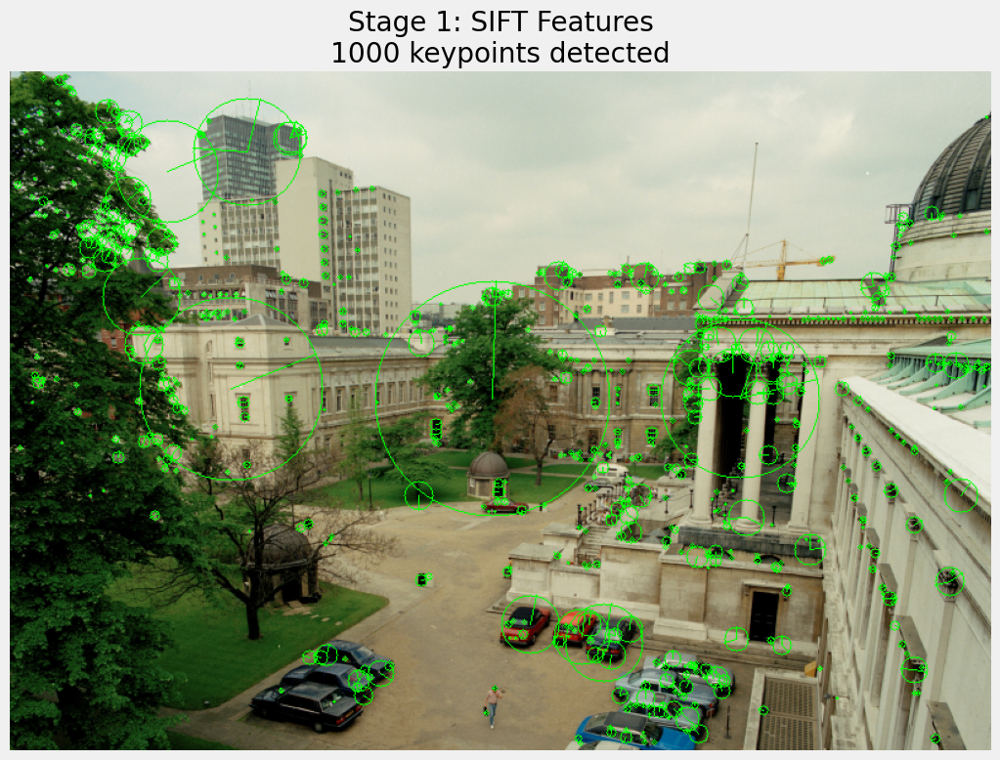


=== Stage 1: Single Image Harris Detection ===


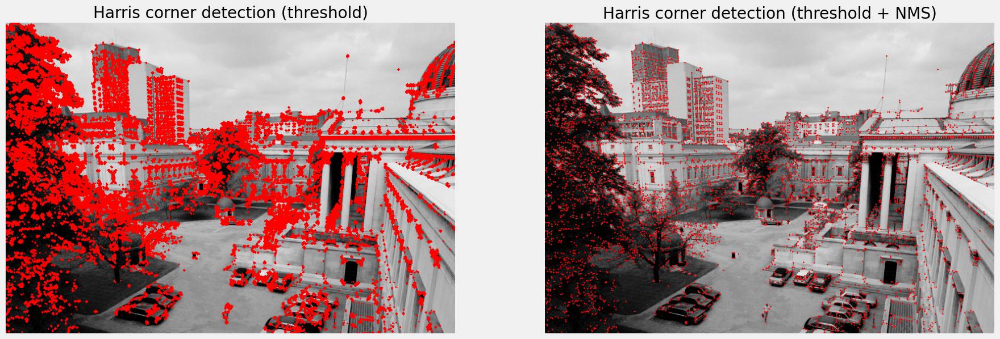


=== Stage 3: FAST Feature Detection ===


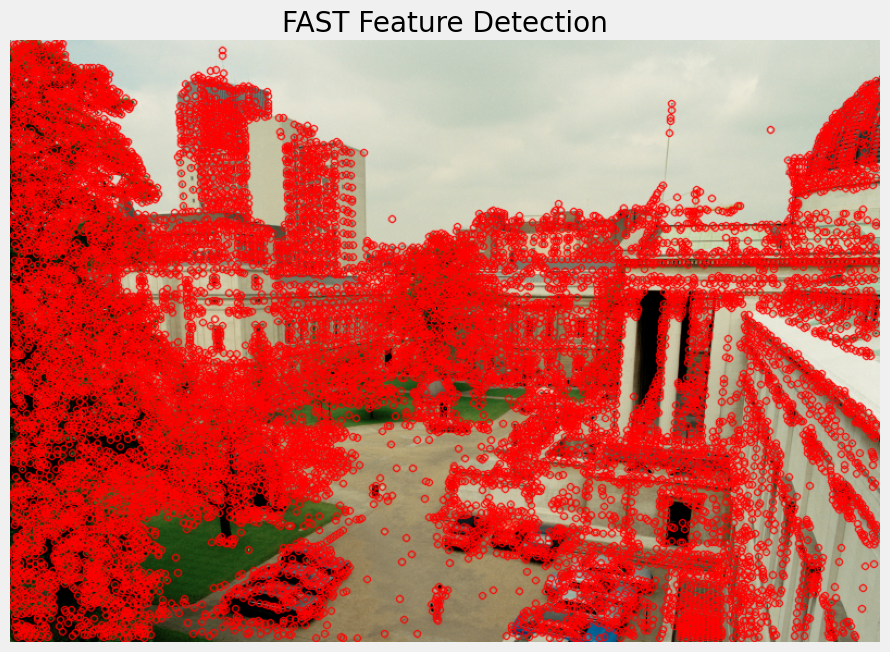

Features detected (FAST): 13774


In [42]:
# Parameters for Stage 1
params = {
    'max_image_size': 800,
    'max_features': 1000,
}

# Image path
img_path = '../dataset/UCL_21May91.jpg'

print("\n=== Stage 1: Single Image SIFT Detection ===")

# Load and process image
t0 = time.time()
img_gray, img_rgb = load_image(img_path, params['max_image_size'])
print(f"Image size: {img_rgb.shape}")

# Detect features
keypoints, descriptors = detect_features(img_gray, params['max_features'])
t1 = time.time()

print(f"Processing time: {t1-t0:.3f} seconds")
print(f"Features detected: {len(keypoints)}")

# Visualize
visualize_features(img_rgb, keypoints, "Stage 1: SIFT Features")
plt.show()

print("\n=== Stage 1: Single Image Harris Detection ===")

k = 0.05
threshold = 2000.

# Apply Harris corner detection
corners, response = harris(img_gray, k=k, threshold=threshold)
harris_img_corner = draw_corners(img_rgb, corners)

# Apply Non-Maximum Suppression (NMS)
corners_nms = nms(response, threshold=threshold, window_size=3)
harris_img_corner_nms = draw_corners(img_rgb, corners_nms)

# Show Original and detected corners on image
fig, axis = plt.subplots(1, 2, figsize=(20, 8), sharey=False)

axis[0].imshow(harris_img_corner, 'gray')
axis[0].grid(False)
axis[0].set_title('Harris corner detection (threshold)')
axis[0].set_axis_off()

axis[1].imshow(harris_img_corner_nms, 'gray')
axis[1].grid(False)
axis[1].set_title('Harris corner detection (threshold + NMS)')
axis[1].set_axis_off()

plt.show()

# FAST feature detection
print("\n=== Stage 3: FAST Feature Detection ===")

# Apply FAST detector
fast = cv2.FastFeatureDetector_create()
fast_keypoints = fast.detect(img_gray, None)

# Draw FAST keypoints
fast_img = cv2.drawKeypoints(img_rgb, fast_keypoints, None, color=(255, 0, 0))

# Show FAST detected features
plt.figure(figsize=(10, 8))
plt.imshow(fast_img)
plt.title("FAST Feature Detection")
plt.axis('off')
plt.show()

print(f"Features detected (FAST): {len(fast_keypoints)}")

#### Match feature Points 


=== Stage 2: Feature Matching ===


Image 1 features: 1000
Image 2 features: 1001
Processing time: 0.452 seconds
Matches found: 104 good matches


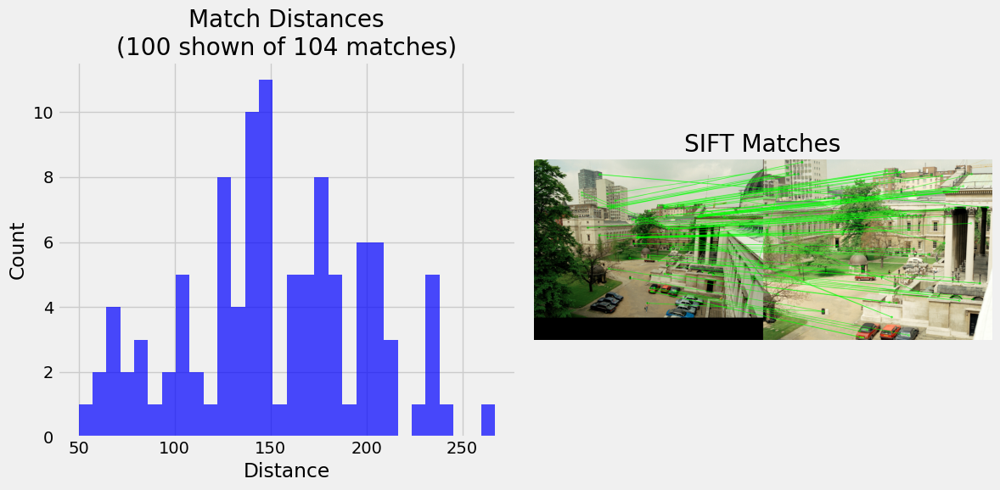


=== Stage 2: Feature Matching ===
Image 1 features: 364
Image 2 features: 370
Processing time: 0.391 seconds
Matches found: 25 good matches


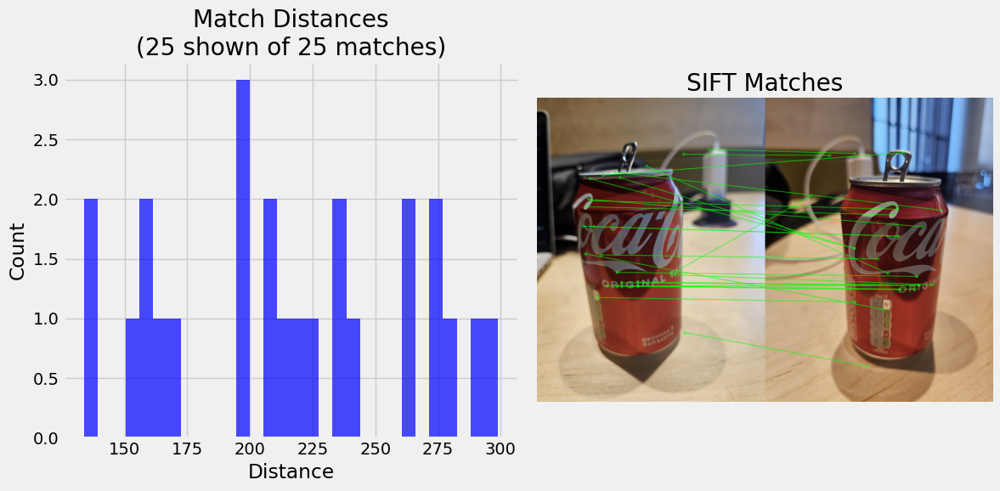


=== Stage 2: Feature Matching ===
Image 1 features: 833
Image 2 features: 914
Processing time: 0.375 seconds
Matches found: 145 good matches


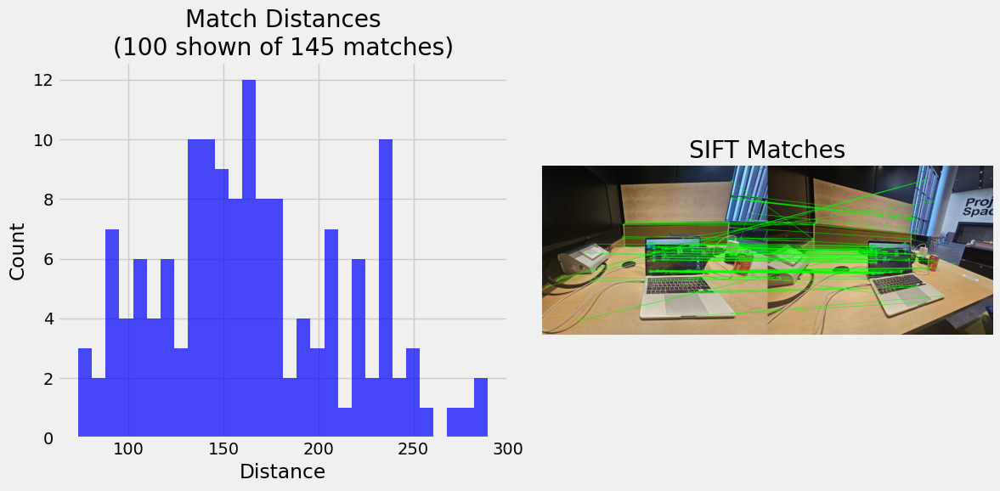


=== Stage 2: Feature Matching ===
Image 1 features: 728
Image 2 features: 787
Processing time: 0.453 seconds
Matches found: 275 good matches


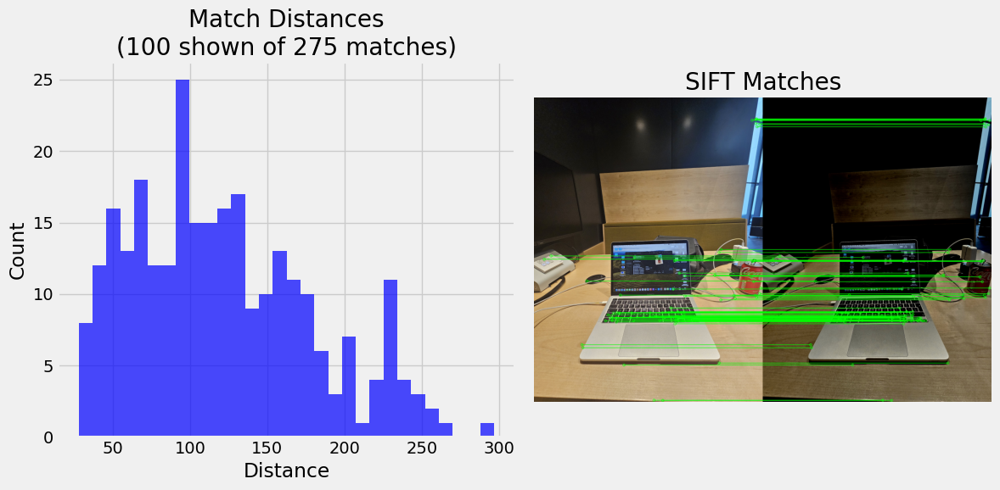

In [43]:
pair_images = [
    ['../dataset/UCL_21May91.jpg', '../dataset/UCLQuad_21May91.jpg'],
    ['../images/small_angle_change_1.jpg', '../images/small_angle_change_2.jpg'],
    ['../images/large_angle_change_1.jpg', '../images/large_angle_change_2.jpg'],
    ['../images/env_diff_1.jpg', '../images/env_diff_2.jpg']
]

for pair_image in pair_images:
    # Parameters for Stage 2
    params = {
        'max_image_size': 800,
        'max_features': 1000,
        'ratio_thresh': 0.75,
        'max_display_matches': 100
    }
    # Image paths
    img1_path = pair_image[0]
    img2_path = pair_image[1]

    print("\n=== Stage 2: Feature Matching ===")

    # Load and process first image
    t0 = time.time()
    img1_gray, img1_rgb = load_image(img1_path, params['max_image_size'])
    keypoints1, descriptors1 = detect_features(img1_gray, params['max_features'])
    print(f"Image 1 features: {len(keypoints1)}")

    # Load and process second image
    img2_gray, img2_rgb = load_image(img2_path, params['max_image_size'])
    keypoints2, descriptors2 = detect_features(img2_gray, params['max_features'])
    print(f"Image 2 features: {len(keypoints2)}")

    # Match features
    good_matches, distances = match_features(descriptors1, descriptors2, 
                                        params['ratio_thresh'])
    t1 = time.time()

    print(f"Processing time: {t1-t0:.3f} seconds")
    print(f"Matches found: {len(good_matches)} good matches")

    # Visualize matches
    visualize_matches(img1_rgb, img2_rgb, keypoints1, keypoints2, 
                    good_matches, distances, params['max_display_matches'])
    plt.show()